## Import

In [2]:
import numpy as np
import gymnasium as gym
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display 
import time   

## Fonksiyonlar

In [3]:
def update_q_table(state, action, reward, new_state, q_table_ref, learning_rate, discount_factor):
    old_q = q_table_ref[state, action]
    q_table_ref[state, action] = old_q + learning_rate * (
        reward + discount_factor * np.max(q_table_ref[new_state]) - old_q
    )

In [4]:
def select_action_epsilon_greedy(state, current_epsilon_val, q_table_ref, action_space):
    if np.random.rand() < current_epsilon_val:
        return action_space.sample()
    else:
        return np.argmax(q_table_ref[state])

def select_deterministic_action(state, q_table_ref):
    return np.argmax(q_table_ref[state])

In [5]:
def display_episode_as_animation(q_table, episode_number, delay_ms=100):
    env = gym.make("FrozenLake-v1", is_slippery=False, render_mode="rgb_array")
    state, _ = env.reset(seed=42)
    done = False
    total_reward = 0
    frames = [] 

    print(f"Bölüm {episode_number} için animasyon kareleri toplanıyor...")

    # Başlangıç durumunu render et ve ekle
    frames.append(env.render())

    while not done:
        action = select_deterministic_action(state, q_table)
        new_state, reward, terminated, truncated, _ = env.step(action)
        
        frames.append(env.render()) 
        
        total_reward += reward
        state = new_state
        done = terminated or truncated
    
    env.close() 

    print(f"Bölüm {episode_number} kare toplama tamamlandı. Toplam ödül: {total_reward}")

    if not frames:
        print("Animasyon için kare bulunamadı.")
        return

    fig, ax = plt.subplots(figsize=(4, 4))
    ax.axis('off')
    im = ax.imshow(frames[0])
    fig.suptitle(f'Ajan Performansı - Bölüm {episode_number} (Ödül: {total_reward:.2f})')
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])

    def update(frame_idx):
        im.set_data(frames[frame_idx])
        return [im]

    anim = FuncAnimation(fig, update, frames=len(frames), interval=delay_ms, blit=True, repeat=False) # blit=True sorun çıkarırsa False yap

    plt.close(fig) 

    display(HTML(anim.to_jshtml()))

## Ana Kod

In [6]:
np.random.seed(42)

# --- 1. Ortam ve Q-Learning Parametreleri Tanımlamaları ---
env = gym.make("FrozenLake-v1", is_slippery=False)
env.reset(seed=42)  # Gym ortamı da tohumlanmalı

num_episodes = 10000

alpha = 0.1             # Öğrenme oranı (learning rate)
gamma = 0.99            # İndirim faktörü (discount factor)

epsilon = 1.0           # Başlangıç keşif oranı
min_epsilon = 0.01      # Minimum keşif oranı
epsilon_decay_rate = 0.00005  # 0.01'e ulaşmak için ayarlandı

num_states = env.observation_space.n
num_actions = env.action_space.n

Q = np.random.uniform(low=0.0, high=0.1, size=(num_states, num_actions))

In [7]:
# --- 3. Q-Learning Eğitimi ---
print("FrozenLake Q-Learning eğitimi başlıyor (epsilon-greedy keşif ile)...")
reward_per_episode = []

for episode in range(num_episodes):
    state, _ = env.reset(seed=42) # Eğer hep aynı başlangıç olmasını istiyorsan seed'i bırak
    terminated = False
    truncated = False
    episode_reward = 0

    current_epsilon = max(min_epsilon, epsilon - epsilon_decay_rate * episode)

    while not terminated and not truncated:
        action = select_action_epsilon_greedy(state, current_epsilon, Q, env.action_space)
        new_state, reward, terminated, truncated, _ = env.step(action)
        update_q_table(state, action, reward, new_state, Q, alpha, gamma)

        episode_reward += reward
        state = new_state
        done = terminated or truncated
    
    reward_per_episode.append(episode_reward)

    
    if episode in [4, 9999]: # Sadece 2 kere için
        print(f"\nBölüm {episode + 1} için Q-tablosu animasyonu:")
        display_episode_as_animation(Q, episode + 1, delay_ms=50) # 50ms gecikme (20 FPS)

    if (episode + 1) % (num_episodes // 10) == 0:
        avg_reward = np.mean(reward_per_episode[-100:])
        print(f"Bölüm {episode + 1}/{num_episodes} tamamlandı. "
              f"Son 100 bölüm ortalama ödül: {avg_reward:.2f}, "
              f"Epsilon: {current_epsilon:.4f}")

env.close()
print("\nQ-Learning eğitimi tamamlandı.")

FrozenLake Q-Learning eğitimi başlıyor (epsilon-greedy keşif ile)...

Bölüm 5 için Q-tablosu animasyonu:
Bölüm 5 için animasyon kareleri toplanıyor...
Bölüm 5 kare toplama tamamlandı. Toplam ödül: 0.0


Bölüm 1000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.00, Epsilon: 0.9500
Bölüm 2000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.02, Epsilon: 0.9001
Bölüm 3000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.06, Epsilon: 0.8500
Bölüm 4000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.11, Epsilon: 0.8000
Bölüm 5000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.12, Epsilon: 0.7500
Bölüm 6000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.22, Epsilon: 0.7001
Bölüm 7000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.27, Epsilon: 0.6501
Bölüm 8000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.30, Epsilon: 0.6000
Bölüm 9000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.29, Epsilon: 0.5500

Bölüm 10000 için Q-tablosu animasyonu:
Bölüm 10000 için animasyon kareleri toplanıyor...
Bölüm 10000 kare toplama tamamlandı. Toplam ödül: 1.0


Bölüm 10000/10000 tamamlandı. Son 100 bölüm ortalama ödül: 0.34, Epsilon: 0.5000

Q-Learning eğitimi tamamlandı.


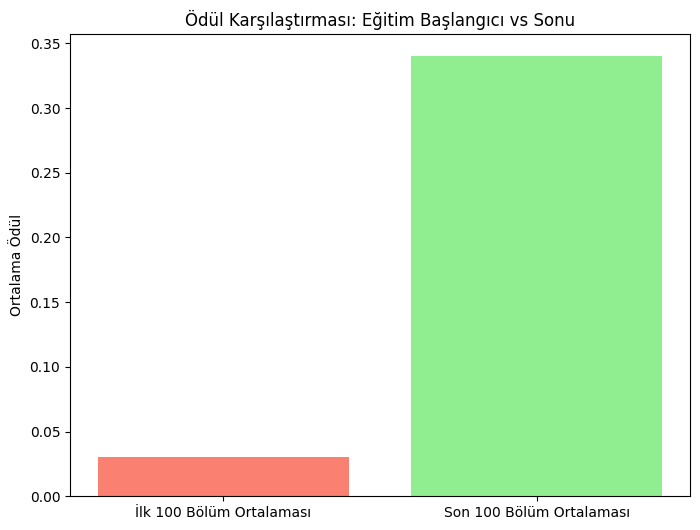

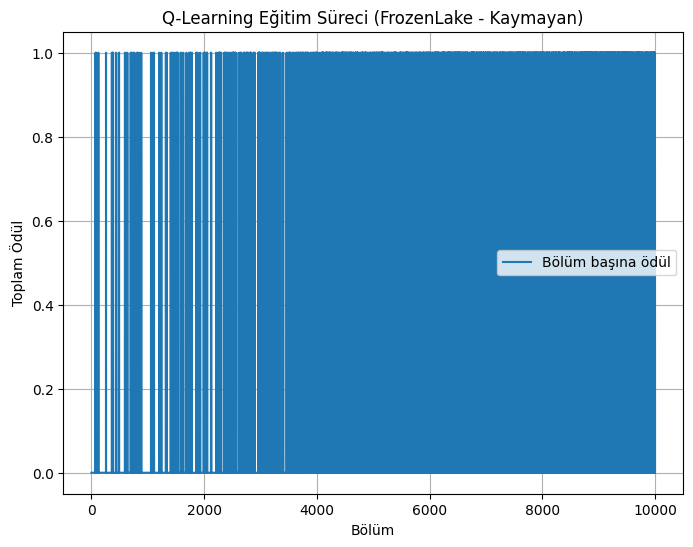

In [8]:
avg_initial = np.mean(reward_per_episode[:100])
avg_final = np.mean(reward_per_episode[-100:])

plt.figure(figsize=(8, 6))
plt.bar(['İlk 100 Bölüm Ortalaması', 'Son 100 Bölüm Ortalaması'],
        [avg_initial, avg_final],
        color=['salmon', 'lightgreen'])
plt.title('Ödül Karşılaştırması: Eğitim Başlangıcı vs Sonu')
plt.ylabel('Ortalama Ödül')
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(reward_per_episode, label='Bölüm başına ödül')
plt.title('Q-Learning Eğitim Süreci (FrozenLake - Kaymayan)')
plt.xlabel('Bölüm')
plt.ylabel('Toplam Ödül')
plt.legend()
plt.grid(True)
plt.show()